In [43]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Loading and pre-processing the data

In [44]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# Load images I1 and I2
img1 = cv2.imread('/content/drive/MyDrive/Autonomous/Data/im1.jpg')
img2 = cv2.imread('/content/drive/MyDrive/Autonomous/Data/im2.jpg')

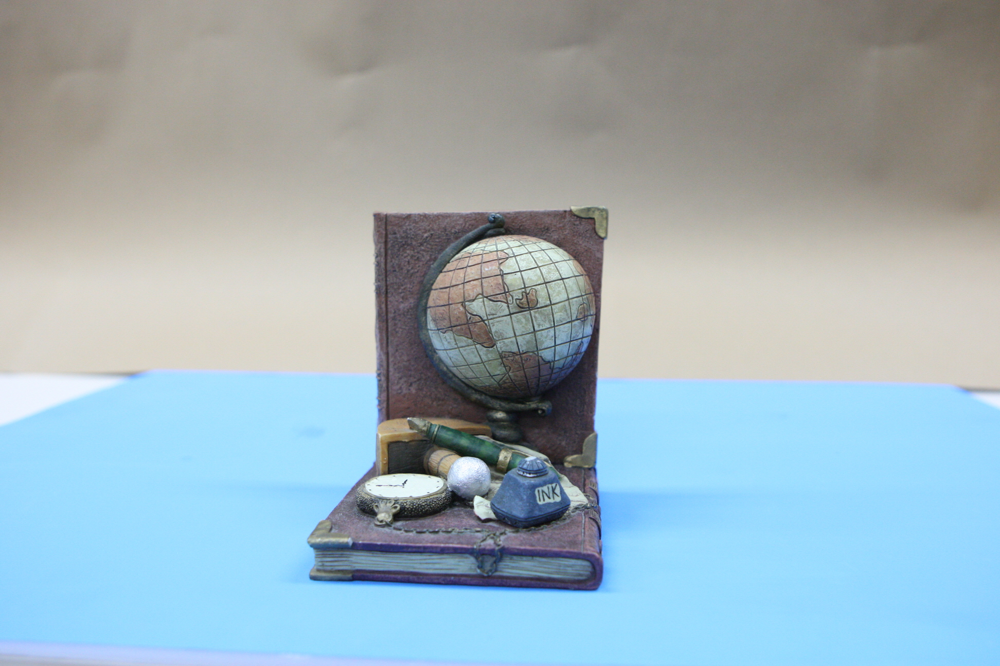

In [45]:
cv2_imshow(img1)

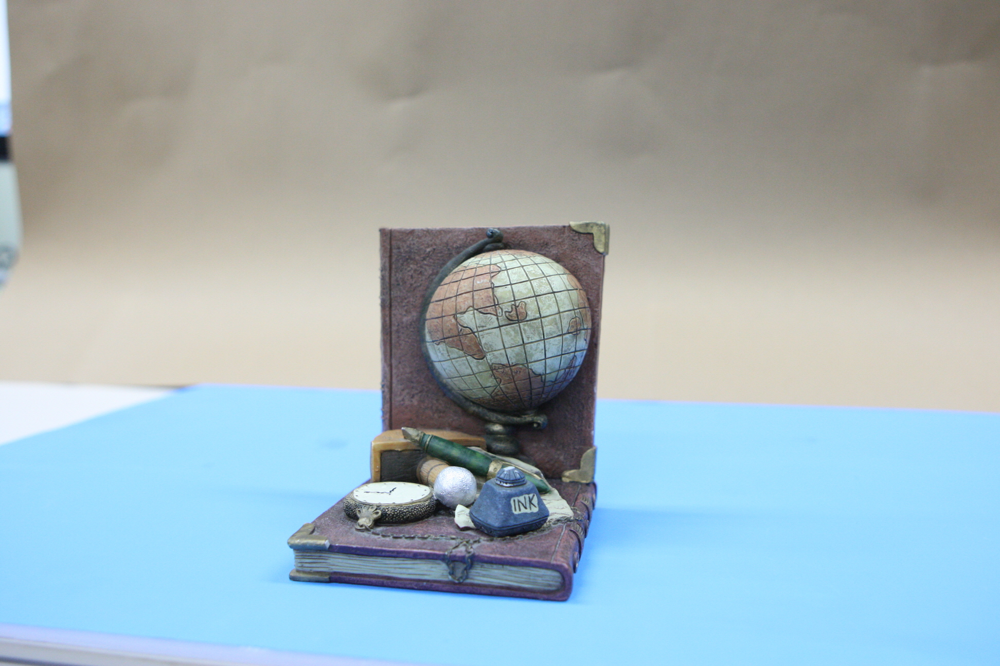

In [46]:
cv2_imshow(img2)

In [47]:
with open("/content/drive/MyDrive/Autonomous/Data/Intrinsic_Matrix_K.txt", "r") as f:
    contents = f.read()
#values = list(map(int, contents))
values = [float(x) for x in contents.split()]
import numpy as np
matrix = np.array(values).reshape(3, 3)
K = matrix
K

array([[1.69887376e+03, 0.00000000e+00, 9.71749770e+02],
       [0.00000000e+00, 1.69887966e+03, 6.47748827e+02],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]])

# Q1.1) Finding the set of correspondences

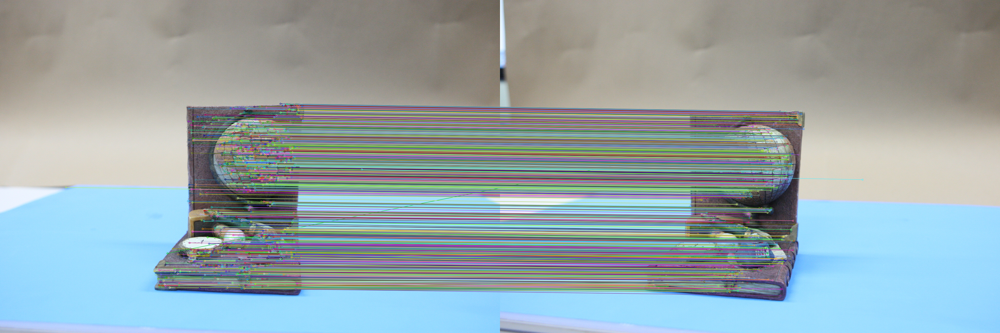

In [48]:
import cv2
import numpy as np



# Create SIFT detector and descriptor
sift = cv2.xfeatures2d.SIFT_create()

# Detect keypoints and compute descriptors
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

# Create FLANN matcher
index_params = dict(algorithm=0, trees=5)
search_params = dict(checks=50)
matcher = cv2.FlannBasedMatcher(index_params, search_params)

# Match descriptors
matches = matcher.knnMatch(des1, des2, k=2)

# Filter matches based on distance ratio test
good_matches = []
for match in matches:
    if len(match) == 2 and match[0].distance < 0.7 * match[1].distance:
        good_matches.append(match[0])

# Increase number of matches if necessary
while len(good_matches) < 100:
    matches = matcher.knnMatch(des1, des2, k=2)
    good_matches = []
    for match in matches:
        if len(match) == 2 and match[0].distance < 0.7 * match[1].distance:
            good_matches.append(match[0])



# Extract corresponding image points
img_points1 = np.float32([kp1[m.queryIdx].pt for m in good_matches])
img_points2 = np.float32([kp2[m.trainIdx].pt for m in good_matches])

# Compute corresponding object points assuming world coordinate system aligned with camera position of first image
obj_points = np.zeros((len(good_matches), 1, 3), np.float32)
for i, match in enumerate(good_matches):
    x1, y1 = kp1[match.queryIdx].pt
    x2, y2 = kp2[match.trainIdx].pt
    obj_points[i, 0, :] = np.array([x1, y1, 1]) * K[0, 0]



# Display correspondences
img_matches = cv2.drawMatches(img1, kp1, img2, kp2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
cv2_imshow(img_matches)
cv2.waitKey()
cv2.destroyAllWindows()

In [49]:
img_points1

array([[ 255.85579,  729.1978 ],
       [ 599.5451 , 1055.0243 ],
       [ 605.53705, 1068.8855 ],
       ...,
       [1173.8253 ,  413.9116 ],
       [1177.1371 ,  470.41556],
       [1406.4004 ,  659.2843 ]], dtype=float32)

In [50]:
img_points2

array([[ 350.19003,  755.10065],
       [ 560.2085 , 1056.4618 ],
       [ 566.7841 , 1070.0416 ],
       ...,
       [1170.697  ,  443.39108],
       [1180.1462 ,  502.00748],
       [1409.2631 ,  698.8335 ]], dtype=float32)

In [51]:
len(img_points1)

1210

# Q1.2) Implementing the Linear 8-point algorithm to find the Essential Matrix

In [52]:
import numpy as np
import cv2

# assuming img_points1 and img_points2 are the corresponding image points in 2 images
# and K is the known intrinsic matrix

# convert image points to homogeneous coordinates
points1_3d = np.concatenate((img_points1, np.ones((len(img_points1), 1))), axis=1)
points2_3d = np.concatenate((img_points2, np.ones((len(img_points2), 1))), axis=1)

# normalize image points by intrinsic matrix
norm_points1 = np.linalg.inv(K) @ points1_3d.T
norm_points2 = np.linalg.inv(K) @ points2_3d.T

# find the essential matrix
A = np.zeros((len(img_points1), 9))
for i in range(len(img_points1)):
    A[i] = np.kron(norm_points1[:, i], norm_points2[:, i])
    
_, _, V = np.linalg.svd(A)
E = V[-1].reshape((3, 3))

# ensure that E has rank 2
U, S, Vt = np.linalg.svd(E)
S[2] = 0
E = U @ np.diag(S) @ Vt


E

array([[ 4.25317602e-02, -6.72013033e-01,  1.05698514e-01],
       [ 7.01592989e-01,  5.06290508e-02,  1.24334450e-01],
       [-9.64256598e-02, -1.25952884e-01,  2.14241788e-04]])

In [53]:
E, mask = cv2.findEssentialMat(img_points1,img_points2, K)
E

array([[-0.00729617,  0.12494651,  0.07588023],
       [-0.04706139,  0.01947852, -0.70148921],
       [-0.06682032,  0.69232978,  0.01051388]])

# Q1.3) Decomposing Essential Matrix to get Rotational and Translational Matrix

In [54]:
#Computing the SVD of Essential matrix E
U, S, Vt = np.linalg.svd(E)

#Skew symmetric matrix W
W = np.array([[0, -1, 0], [1, 0, 0], [0, 0, 1]])

In [55]:
#Computing Rotation matrix
R = np.dot(U, np.dot(W, Vt))
print("Rotation matrix:\n", R)

Rotation matrix:
 [[-0.99342398  0.011189   -0.11394557]
 [-0.00813751 -0.99959661 -0.02721025]
 [ 0.11420406  0.02610408 -0.9931143 ]]


In [56]:
#Scaling Factor s
s = np.sign(np.linalg.det(R))

#Computing Translational vector t
t = s * U[:, 2]
print("Translation vector:\n", t)

Translation vector:
 [-0.97834281 -0.10313772  0.17946576]




# Q1.4) Triangulation

In [57]:
import numpy as np

# Intrinsic parameters matrix
a = t[0]
b = t[1]
c = t[2]
trans_matrix = np.array([[a],[b],[c]])
trans_matrix

Matrix_3D = []

# Projection matrices for the two cameras
P1 = K @ np.hstack((np.identity(3), np.zeros((3, 1))))
P2 = K @ np.hstack((R, trans_matrix))

for i in range (0,len(img_points1)):
  # Homogeneous image points
  # x1 = np.hstack((points1_3d[i], 1))
  # x2 = np.hstack((points2_3d[i], 1))
  x1 = points1_3d[i]
  x2 = points2_3d[i]
  # Triangulation
  A = np.vstack((x1[0] * P1[2, :] - P1[0, :],
                x1[1] * P1[2, :] - P1[1, :],
                x2[0] * P2[2, :] - P2[0, :],
                x2[1] * P2[2, :] - P2[1, :]))
  U, S, V = np.linalg.svd(A)
  X = V[-1, :-1] / V[-1, -1]  # Non-homogeneous 3D point
  Pi = X
  # Convert to Euclidean coordinates
  # Pi = X[:3] / X[3]
  # print(Pi)
  Matrix_3D.append(Pi)

Matrix_3D

[array([  5.13938053,  -0.60525458, -12.19100383]),
 array([ 1.47648858, -1.61585282, -6.73906762]),
 array([ 1.46036344, -1.6791801 , -6.77480079]),
 array([ 1.46147165, -1.5692295 , -6.8074549 ]),
 array([ 1.42734997, -1.7441422 , -6.78055094]),
 array([ 1.41297336, -1.84882581, -6.79489565]),
 array([ 1.39830405, -1.59753651, -6.72773851]),
 array([ 1.39983985, -1.87045996, -6.76253889]),
 array([ 1.39669224, -1.79495444, -6.78652956]),
 array([ 1.39669224, -1.79495444, -6.78652956]),
 array([ 1.39241066, -1.80953339, -6.78055526]),
 array([ 1.3955037 , -1.83149919, -6.80174466]),
 array([ 1.38343817, -1.67887059, -6.78209683]),
 array([ 1.36094123, -1.85584638, -6.79732701]),
 array([ 1.34812458, -1.78161861, -6.80230958]),
 array([ 1.33286168, -1.8373422 , -6.81354445]),
 array([ 1.32414456, -1.72379705, -6.79085851]),
 array([ 1.31728114, -1.85903652, -6.79843273]),
 array([ 1.31728114, -1.85903652, -6.79843273]),
 array([ 1.34312364, -1.56064407, -6.94027991]),
 array([ 1.343123

In this code, K is the intrinsic parameters matrix, and P1 and P2 are the projection matrices for the two cameras. R and t represent the rotation and translation between the two cameras, respectively.

The image points pi and p'i are given in homogeneous coordinates, where the last element is 1. To perform triangulation, we first stack the four equations for the two cameras and two image points into a matrix A. We then use singular value decomposition (SVD) to solve the system of equations and obtain the homogeneous 3D point X.

# Q1.5) Plotting and Visualization


In [58]:
import numpy as np

# Compute camera center t from camera matrix M
M = K @ np.hstack((R, t.reshape(-1, 1)))
U, S, V = np.linalg.svd(M)
t_hom = V[-1]
t_hom /= t_hom[-1]
t_center = t_hom[:-1]

t_center

array([-0.99324421, -0.09683423,  0.06394577])

In this code, we first use the singular value decomposition (SVD) of P to find its right singular vector corresponding to the smallest singular value. This vector is proportional to the camera center in homogeneous coordinates (i.e., it has a last coordinate of 1). We divide this vector by its last coordinate to obtain the camera center in non-homogeneous coordinates (i.e., we discard the last coordinate). The resulting t vector is the camera center.

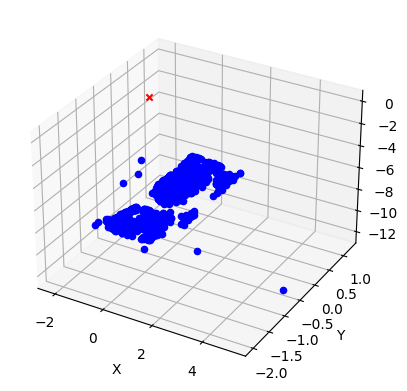

In [59]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Plot 3D points
fig = plt.figure()
ax = fig.add_subplot(  projection='3d')
for i in range(len(Matrix_3D)):
  ax.scatter(Matrix_3D[i][0], Matrix_3D[i][1], Matrix_3D[i][2], c='b', marker='o')

# Plotting camera center
ax.scatter(t_center[0], t_center[1], t_center[2], c='r', marker='x')


# set axis labels
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.show()